# Tinklo analizė

## R funkcija, kuri atvaizduoja pačius įtakingiausius mokslininkus.

Įtakingiausi mokslininkai bus įvertinti, remiantis šiomis tinklo centrališkumo metrikomis:
- *degree* - vertina mokslininko populiarumą, remiantis su kiek skirtingų autorių konkretus mokslininkas dirbo.
- *betweenness* - mokslininkas, jungiantis skirtingas grupes, pvz. grupes, kurios specializuojasi skirtingose dirbtinio intelekto temose.
- *pagerank* - vertina mokslininko populiarumą (prestižą), remiantis su kiek daugausiai cituojamų autorių konkretus autorius bendradarbiavo.

Kadangi duomenų šaltinyje yra net **18591** mokslininkas, todėl pilno tinklo atvaizdavimas yra nepraktiškas. Norint sumažinti tinklo viršūnių kiekį, atvaizduosime tik viršūnes, kurios yra tiesiogiai sujungtos su 5 įtakingiausiais mokslininkais.

In [29]:
suppressPackageStartupMessages({
  library(igraph)
  library(ggraph)
  library(ggplot2)
  library(tibble)
  library(dplyr)
  library(patchwork)
})

visualize_influencers <- function(file_path, citation_path = "./dataset/generated/author_citations.csv", top_k = 3, title = '') {
  
  # --- 1. STABILITY FIX: Set Seed Inside Function ---
  set.seed(42)
  
  # --- 2. Read Data ---
  if (!file.exists(file_path)) {
    stop("The file path provided does not exist.")
  }
  
  df_raw <- read.csv(file_path, check.names = FALSE)
  
  # --- 3. Build & Simplify Graph ---
  g <- graph_from_data_frame(df_raw, directed = FALSE)
  
  g <- simplify(
    g,
    remove.multiple = TRUE,
    remove.loops    = TRUE,
    edge.attr.comb  = "first"
  )
  
  # Remove isolated nodes
  g <- delete_vertices(g, V(g)[degree(g) == 0])

  # --- 4. Read Citations Data ---
  citations_vec <- NULL
  if (file.exists(citation_path)) {
    df_cit <- read.csv(citation_path, check.names = FALSE, stringsAsFactors = FALSE)
    colnames(df_cit)[1:2] <- c("Author", "Citations")
    df_cit <- df_cit %>% 
      group_by(Author) %>% 
      summarize(Citations = max(Citations), .groups = 'drop')
    citations_vec <- setNames(df_cit$Citations, df_cit$Author)
  } else {
    warning(paste("Citation file not found at:", citation_path, "- Citations set to 0."))
  }
  
  # Map Citations
  if (!is.null(citations_vec)) {
    V(g)$citations <- citations_vec[V(g)$name]
    V(g)$citations[is.na(V(g)$citations)] <- 0
  } else {
    V(g)$citations <- 0
  }
  
  # --- 5. Node Metrics & Composite Score ---
  V(g)$degree      <- degree(g)
  V(g)$betweenness <- betweenness(g, directed = FALSE, normalized = TRUE)
  
  # PageRank (Personalized)
  pr_weights <- V(g)$citations + 1 
  V(g)$pagerank <- page_rank(g, directed = FALSE, personalized = pr_weights, weights=NULL)$vector
  
  V(g)$label <- V(g)$name
  
  # Normalize Function
  normalize <- function(x) {
    if (max(x) == min(x)) return(rep(0, length(x))) 
    return ((x - min(x)) / (max(x) - min(x)))
  }
  
  score_deg  <- normalize(V(g)$degree)
  score_bet  <- normalize(V(g)$betweenness)
  score_pr   <- normalize(V(g)$pagerank)
  
  # Calculate Score
  V(g)$influence_score <- (score_deg + score_bet + score_pr) / 3
  
  # --- 6. Select Top Nodes ---
  valid_top_k <- min(top_k, vcount(g)) 
  top_ix <- order(V(g)$influence_score, decreasing = TRUE)[1:valid_top_k]
  top_names <- V(g)$name[top_ix]
  
  # === ADDED: PRINT TABLE TO CONSOLE ===
  print(paste0("--- Top ", valid_top_k, " Influencers (Composite Score) ---"))
  print(data.frame(
    Name        = V(g)$name[top_ix],
    Score       = round(V(g)$influence_score[top_ix], 3),
    Degree      = V(g)$degree[top_ix],
    Betweenness = round(V(g)$betweenness[top_ix], 4),
    PageRank    = round(V(g)$pagerank[top_ix], 4),
    Citations   = V(g)$citations[top_ix]
  ))
  # =====================================
  
  # --- 7. Generate Ego Subgraph ---
  print(paste("--- Generating Ego Graph for Top", valid_top_k, "Influencers ---"))
  
  # Create Subgraph: Top nodes + their direct neighbors
  sub_vertices <- unique(unlist(ego(g, order = 1, nodes = top_ix)))
  g_sub <- induced_subgraph(g, vids = sub_vertices)
  
  # Mark who the "Top" influencers are in the new subgraph
  V(g_sub)$is_top <- V(g_sub)$name %in% top_names
  
  # Clean Edges: Keep only connections involving a Top Influencer (Hub-and-Spoke look)
  top_in_sub_indices <- which(V(g_sub)$is_top)
  g_sub <- delete_edges(g_sub, E(g_sub)[ ! (.inc(V(g_sub)[top_in_sub_indices])) ])
  
  # --- 8. Layout ---
  coords <- layout_with_fr(g_sub)
  layout_tbl <- create_layout(g_sub, layout = "manual", x = coords[, 1], y = coords[, 2])
  
  # --- 9. Plotting ---
  p <- ggraph(layout_tbl) +
    
    # Edges
    geom_edge_arc(
      aes(width = CoAuthored, alpha = CoAuthored),
      edge_colour = "grey60", strength = 0.9, show.legend = FALSE
    ) +
    
    # Nodes
    geom_node_point(
      aes(size = influence_score, color = factor(is_top)),
      show.legend = TRUE
    ) +
    
    # Labels - Neighbors
    geom_node_text(
      aes(label = label, filter = !is_top), 
      color = "grey40", 
      size = 3,
      repel = TRUE, 
      max.overlaps = Inf
    ) +
    
    # Labels - Top Influencers
    geom_node_text(
      aes(label = label, filter = is_top),
      color = "black",        
      size = 8,              
      fontface = "bold",
      repel = TRUE,
      bg.color = "white",
      bg.r = 0.15,
      max.overlaps = Inf
    ) +
    
    # Scales
    scale_edge_width_continuous(range = c(0.2, 1.0)) +
    scale_edge_alpha_continuous(range = c(0.2, 0.5)) +
    scale_size_continuous(range = c(3, 10), name = "Influence") + 
    scale_color_manual(
      name   = "Node Type",
      values = c("FALSE" = "grey70", "TRUE" = "#D4AC0D"),
      labels = c("FALSE" = "Neighbor", "TRUE"  = "Top Influencer")
    ) +
    
    coord_equal() +
    theme_void() + 
    theme(
      plot.title = element_text(size = 20, hjust = 0.5, face = "bold", margin = margin(b = 20)),
      legend.position = "bottom"
    ) +
    ggtitle(title)
  
  return(p)
}

[1] "--- Top 10 Influencers (Composite Score) ---"
           Name Score Degree Betweenness PageRank Citations
1      Zhang, L 0.906    172      0.0322   0.0029     89317
2       Tao, DC 0.727    130      0.0321   0.0018     35083
3        Sun, J 0.647     61      0.0199   0.0040    271645
4   Van Gool, L 0.602    119      0.0203   0.0020     68993
5   Girshick, R 0.532     52      0.0096   0.0041    219462
6      Wang, XG 0.499     71      0.0193   0.0020     71266
7  Zisserman, A 0.487     67      0.0179   0.0021     72606
8        He, KM 0.475     38      0.0070   0.0040    336843
9      Yang, MH 0.474    108      0.0127   0.0016     59759
10    Zhang, XY 0.462     54      0.0099   0.0031    194403
[1] "--- Generating Ego Graph for Top 10 Influencers ---"


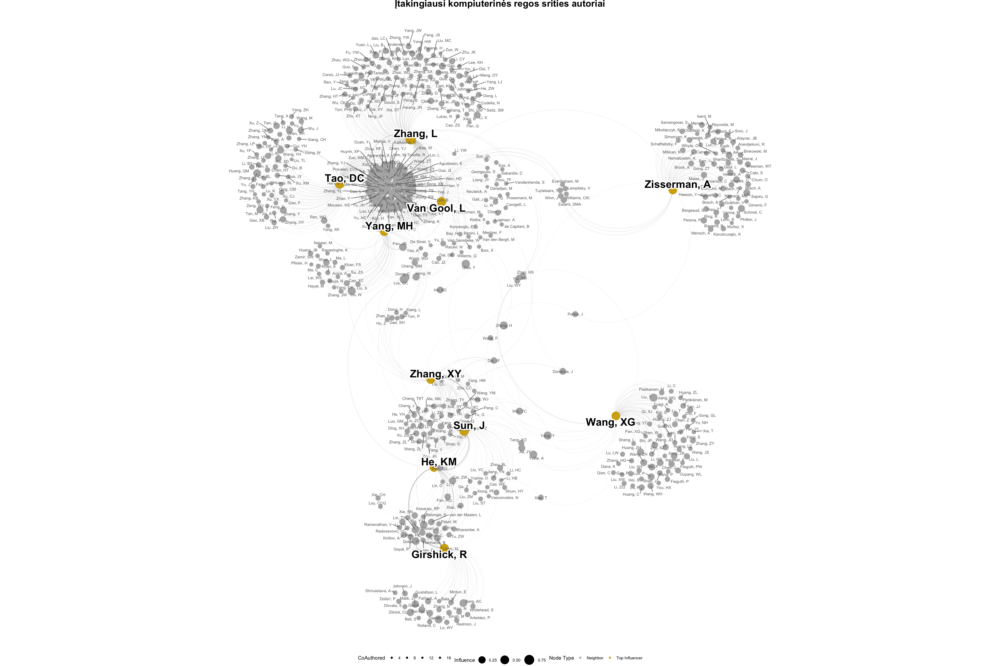

In [30]:
my_path <- "./dataset/generated/topic_computer_vision_adjacency.csv"
final_plot <- visualize_influencers(my_path, top_k = 10, title='Įtakingiausi kompiuterinės regos srities autoriai')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

[1] "--- Top 10 Influencers (Composite Score) ---"
         Name Score Degree Betweenness PageRank Citations
1      Liu, Y 0.856    137      0.0487   0.0046     51585
2   Narang, S 0.647    160      0.0258   0.0027     12514
3     Wang, Y 0.628    108      0.0407   0.0025     20141
4    Elsen, E 0.513    108      0.0311   0.0015      2858
5       Le, Q 0.482     70      0.0245   0.0033     36427
6    Zhang, Y 0.481     58      0.0224   0.0041     31472
7    Wang, XZ 0.478    115      0.0173   0.0024      9835
8  Shazeer, N 0.458     82      0.0050   0.0049    104699
9   Bengio, Y 0.405     30      0.0122   0.0051     91403
10     Lee, K 0.403     89      0.0037   0.0038     67649
[1] "--- Generating Ego Graph for Top 10 Influencers ---"


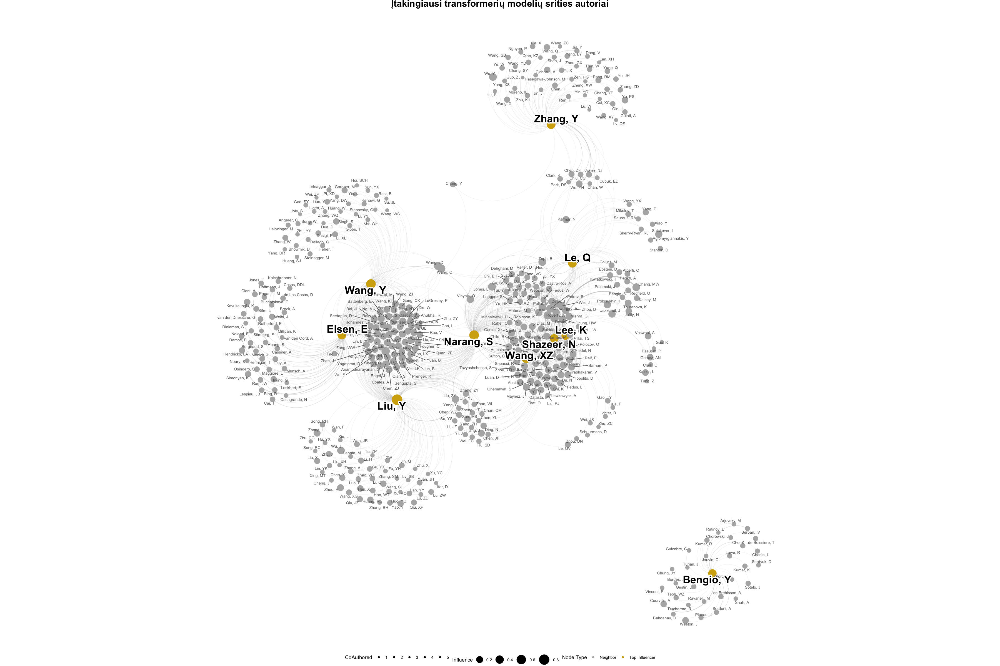

In [31]:
my_path <- "./dataset/generated/topic_transformer_based_nlp_adjacency.csv"
final_plot <- visualize_influencers(my_path, top_k = 10, title='Įtakingiausi transformerių modelių srities autoriai')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

[1] "--- Top 10 Influencers (Composite Score) ---"
          Name Score Degree Betweenness PageRank Citations
1     Zhang, L 0.919    520      0.0229   0.0017     89317
2       Liu, Y 0.916    513      0.0250   0.0015     51585
3     Zhang, Y 0.721    399      0.0205   0.0012     31472
4      Tao, DC 0.700    467      0.0157   0.0011     35083
5     Yang, MH 0.681    498      0.0108   0.0013     59759
6        Li, Y 0.666    434      0.0144   0.0012     40479
7     Matas, J 0.656    493      0.0130   0.0010     26968
8  Van Gool, L 0.524    319      0.0101   0.0011     68993
9        Li, H 0.512    289      0.0136   0.0009     34384
10       Li, X 0.488    363      0.0091   0.0008     22229
[1] "--- Generating Ego Graph for Top 10 Influencers ---"


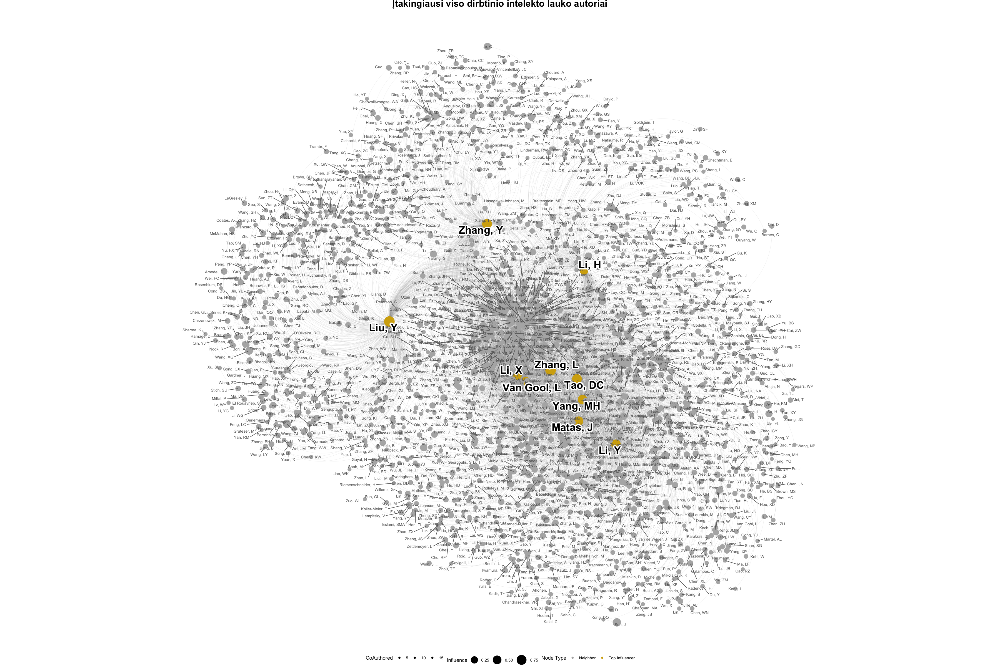

In [32]:
my_path <- "./dataset/generated/adjacency.csv"
final_plot <- visualize_influencers(my_path, top_k = 10, title='Įtakingiausi viso dirbtinio intelekto lauko autoriai')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

## R funkcija, kuri atvaizduoja pačią įtakingiausią bendruomenę

In [46]:
suppressPackageStartupMessages({
  library(igraph)
  library(ggraph)
  library(ggplot2)
  library(tibble)
  library(dplyr)
  library(patchwork)
  library(RColorBrewer)
})

visualize_most_influential_community <- function(file_path, citation_path = "./dataset/generated/author_citations.csv", top_k = 3, label_limit = 150, title = '') {
  
  # --- STABILITY: Set Seed ---
  set.seed(42) 
  
  # --- 1. Read Data ---
  if (!file.exists(file_path)) {
    stop("The file path provided does not exist.")
  }
  
  df_raw <- read.csv(file_path, check.names = FALSE)
  
  # --- 2. Build Graph ---
  g <- graph_from_data_frame(df_raw, directed = FALSE)
  
  g <- simplify(
    g,
    remove.multiple = TRUE,
    remove.loops    = TRUE,
    edge.attr.comb  = "first"
  )
  
  # --- Remove Degree 0 Nodes ---
  g <- delete_vertices(g, V(g)[degree(g) == 0])
  if (vcount(g) == 0) stop("Graph is empty after removing degree 0 nodes.")

  # --- 1b. Read Citations Data ---
  citations_vec <- NULL
  if (file.exists(citation_path)) {
    df_cit <- read.csv(citation_path, check.names = FALSE, stringsAsFactors = FALSE)
    colnames(df_cit)[1:2] <- c("Author", "Citations")
    df_cit <- df_cit %>% 
      group_by(Author) %>% 
      summarize(Citations = max(Citations), .groups = 'drop')
    citations_vec <- setNames(df_cit$Citations, df_cit$Author)
  } else {
    warning(paste("Citation file not found at:", citation_path, "- Citations set to 0."))
  }
  
  # Map Citations
  if (!is.null(citations_vec)) {
    V(g)$citations <- citations_vec[V(g)$name]
    V(g)$citations[is.na(V(g)$citations)] <- 0
  } else {
    V(g)$citations <- 0
  }
  
  # --- 3. Node Metrics ---
  V(g)$degree      <- degree(g)
  V(g)$betweenness <- betweenness(g, directed = FALSE, normalized = TRUE)
  pr_weights       <- V(g)$citations + 1 
  V(g)$pagerank    <- page_rank(g, directed = FALSE, personalized = pr_weights, weights=NULL)$vector
  
  # --- Community Detection ---
  try({
    V(g)$community <- cluster_louvain(g, weights = NULL)$membership
  }, silent = TRUE)
  if (is.null(V(g)$community)) V(g)$community <- 1 
  
  V(g)$label <- V(g)$name
  
  # --- Composite Score ---
  normalize <- function(x) {
    if (max(x) == min(x)) return(rep(0, length(x))) 
    return ((x - min(x)) / (max(x) - min(x)))
  }
  
  score_deg  <- normalize(V(g)$degree)
  score_bet  <- normalize(V(g)$betweenness)
  score_pr   <- normalize(V(g)$pagerank)
  
  V(g)$influence_score <- (score_deg + score_bet + score_pr) / 3
  
  # =========================================================
  # FIND MOST INFLUENTIAL COMMUNITY
  # =========================================================
  
  comm_data <- data.frame(
    id = V(g)$community,
    score = V(g)$influence_score
  )
  
  comm_stats <- comm_data %>%
    group_by(id) %>%
    summarize(
      total_influence = sum(score),
      member_count = n()
    ) %>%
    arrange(desc(total_influence))
  
  best_comm_id <- comm_stats$id[1]
  
  print(paste("--- Displaying Community", best_comm_id, "---"))
  print(paste("Total Influence Score:", round(comm_stats$total_influence[1], 2)))
  print(paste("Member Count:", comm_stats$member_count[1]))
  
  # Create Subgraph of ONLY this community
  g_sub <- induced_subgraph(g, V(g)$community == best_comm_id)
  
  # =========================================================
  
  # --- Recalculate Top K within this community ---
  valid_top_k <- min(top_k, vcount(g_sub)) 
  # Get indices for subgraph
  top_ix_sub <- order(V(g_sub)$influence_score, decreasing = TRUE)[1:valid_top_k]
  
  # Mark Top Nodes
  V(g_sub)$is_top <- FALSE
  V(g_sub)$is_top[top_ix_sub] <- TRUE
  
  # --- PRINT TABLE (Console Output) ---
  print(paste0("--- Top ", valid_top_k, " Influencers in Community ", best_comm_id, " ---"))
  print(data.frame(
    Name        = V(g_sub)$name[top_ix_sub],
    Score       = round(V(g_sub)$influence_score[top_ix_sub], 3),
    Degree      = V(g_sub)$degree[top_ix_sub],
    Betweenness = round(V(g_sub)$betweenness[top_ix_sub], 4),
    PageRank    = round(V(g_sub)$pagerank[top_ix_sub], 4),
    Citations   = V(g_sub)$citations[top_ix_sub]
  ))

  # --- Filter Labels (Limit non-top labels to prevent clutter) ---
  # We always label the Top K. We only limit the 'grey' nodes.
  all_ix <- order(V(g_sub)$influence_score, decreasing = TRUE)
  
  # Helper to decide who gets a label
  V(g_sub)$should_label <- FALSE
  # Always label top k
  V(g_sub)$should_label[top_ix_sub] <- TRUE
  # Label others up to limit
  remaining_limit <- max(0, label_limit - valid_top_k)
  if (remaining_limit > 0) {
     non_top_ix <- setdiff(all_ix, top_ix_sub)
     # Pick the next best influential people to fill the limit
     if(length(non_top_ix) > 0) {
       picked_others <- non_top_ix[1:min(length(non_top_ix), remaining_limit)]
       V(g_sub)$should_label[picked_others] <- TRUE
     }
  }

  # --- Layout ---
  coords <- layout_with_fr(g_sub)
  layout_tbl <- create_layout(g_sub, layout = "manual", x = coords[, 1], y = coords[, 2])
  
  # --- Plotting (Applying the Gold/Grey Style) ---
  p <- ggraph(layout_tbl) +
    
    # Edges
    geom_edge_arc(
      aes(width = CoAuthored, alpha = CoAuthored),
      edge_colour = "grey60", strength = 0.9, show.legend = FALSE
    ) +
    
    # Nodes (Mapped to is_top)
    geom_node_point(
      aes(size = influence_score, color = factor(is_top)),
      show.legend = TRUE 
    ) +
    
    # Labels - The "Regular" Community Members (Grey, Small)
    geom_node_text(
      aes(label = label, size = influence_score, filter = should_label & !is_top), 
      color = "grey40", 
      repel = TRUE, 
      bg.color = "white", 
      bg.r = 0.1,
      max.overlaps = Inf
    ) +
    
    # Labels - The "Top" Influencers (Black, Bold, Large)
    geom_node_text(
      aes(label = label, filter = is_top),
      color = "black",        
      size = 8,              
      fontface = "bold",
      repel = TRUE,
      bg.color = "white",
      bg.r = 0.15,
      max.overlaps = Inf
    ) +
    
    # Scales
    scale_edge_width_continuous(range = c(0.2, 0.8)) +
    scale_edge_alpha_continuous(range = c(0.3, 0.6)) +
    
    # Size scale handles the dots
    scale_size_continuous(range = c(3, 10), guide = "none") + 
    
    # Color scale handles the Gold vs Grey
    scale_color_manual(
      name   = "Node Type",
      values = c("FALSE" = "grey70", "TRUE" = "#D4AC0D"),
      labels = c("FALSE" = "Community Member", "TRUE"  = "Top Influencer")
    ) +
    
    coord_equal() +
    theme_void() + 
    theme(
      plot.title = element_text(size = 25, hjust = 0.5, face = "bold", margin = margin(b = 20)),
      legend.position = "bottom"
    ) +
    ggtitle(title)
  
  return(p)
}

[1] "--- Displaying Community 3 ---"
[1] "Total Influence Score: 21.52"
[1] "Member Count: 208"
[1] "--- Top 10 Influencers in Community 3 ---"
          Name Score Degree Betweenness PageRank Citations
1     Zhang, L 0.906    172      0.0322   0.0029     89317
2      Tao, DC 0.727    130      0.0321   0.0018     35083
3  Van Gool, L 0.602    119      0.0203   0.0020     68993
4     Yang, MH 0.474    108      0.0127   0.0016     59759
5      Loy, CC 0.453    112      0.0103   0.0016     35134
6      Qiao, Y 0.423    115      0.0093   0.0013     20824
7      Zuo, WM 0.393    105      0.0079   0.0013     34289
8      Zhao, Y 0.381     99      0.0102   0.0010     11431
9    Huang, TS 0.371     95      0.0089   0.0012     22915
10    Wang, ZY 0.354     99      0.0073   0.0011     17239


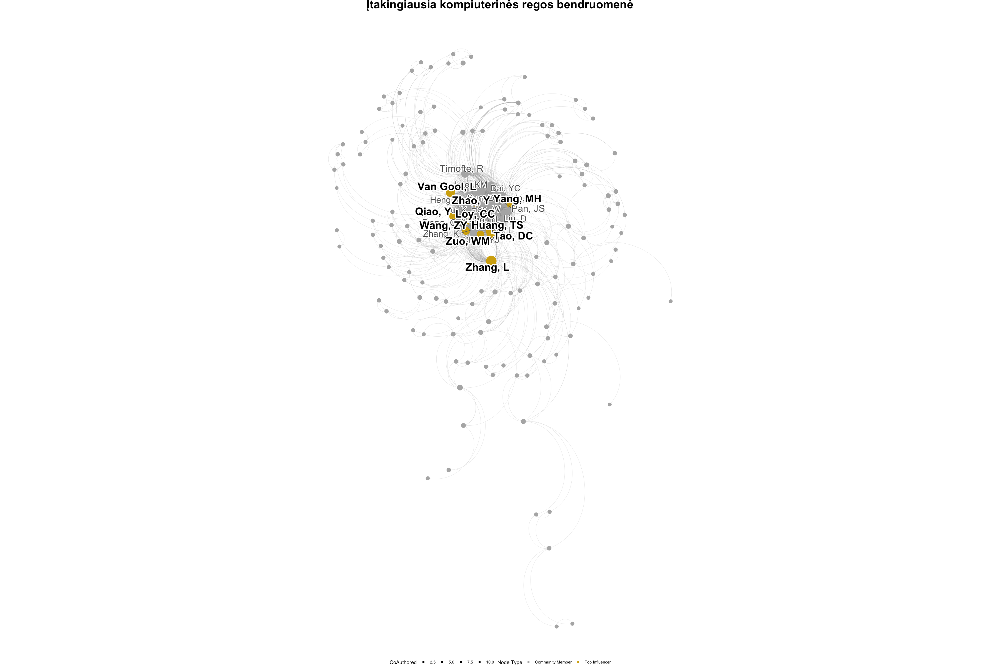

In [47]:
my_path <- "./dataset/generated/topic_computer_vision_adjacency.csv"
final_plot <- visualize_most_influential_community(my_path, top_k = 10, label_limit=25, title='Įtakingiausia kompiuterinės regos bendruomenė')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

[1] "--- Displaying Community 4 ---"
[1] "Total Influence Score: 18.71"
[1] "Member Count: 104"
[1] "--- Top 10 Influencers in Community 4 ---"
         Name Score Degree Betweenness PageRank Citations
1   Narang, S 0.647    160      0.0258   0.0027     12514
2       Le, Q 0.482     70      0.0245   0.0033     36427
3    Wang, XZ 0.478    115      0.0173   0.0024      9835
4  Shazeer, N 0.458     82      0.0050   0.0049    104699
5      Lee, K 0.403     89      0.0037   0.0038     67649
6   Devlin, J 0.396    100      0.0027   0.0033     52415
7    Child, R 0.373     96      0.0042   0.0028     18117
8   Petrov, S 0.352    100      0.0027   0.0025      2783
9  Roberts, A 0.345     98      0.0058   0.0020     11889
10    Zoph, B 0.320     92      0.0042   0.0020     18559


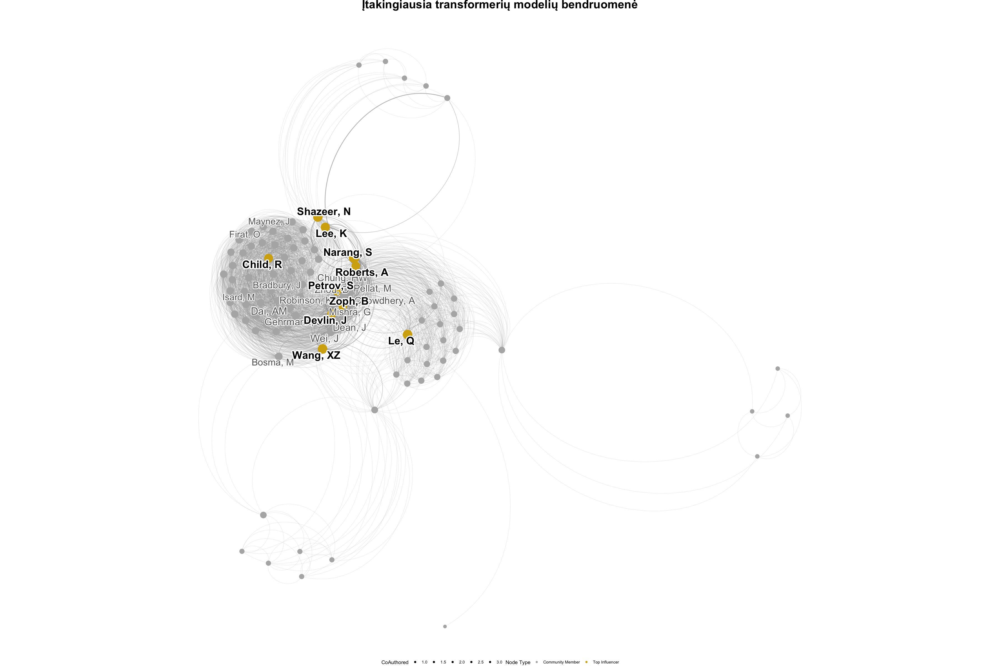

In [48]:
my_path <- "./dataset/generated/topic_transformer_based_nlp_adjacency.csv"
final_plot <- visualize_most_influential_community(my_path, top_k = 10, label_limit=25, title='Įtakingiausia transformerių modelių bendruomenė')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

[1] "--- Displaying Community 5 ---"
[1] "Total Influence Score: 47.27"
[1] "Member Count: 446"
[1] "--- Top 10 Influencers in Community 5 ---"
           Name Score Degree Betweenness PageRank Citations
1      Yang, MH 0.681    498      0.0108   0.0013     59759
2         Li, Y 0.666    434      0.0144   0.0012     40479
3      Matas, J 0.656    493      0.0130   0.0010     26968
4  Leonardis, A 0.447    445      0.0035   0.0007      5581
5      Khan, FS 0.442    451      0.0022   0.0007     19256
6     Torr, PHS 0.437    381      0.0050   0.0008     29326
7  Danelljan, M 0.428    444      0.0017   0.0007     19393
8        Hu, WM 0.428    438      0.0022   0.0007     10440
9         Wu, Y 0.422    265      0.0094   0.0008     25792
10     Zhang, Z 0.420    331      0.0049   0.0009     38083


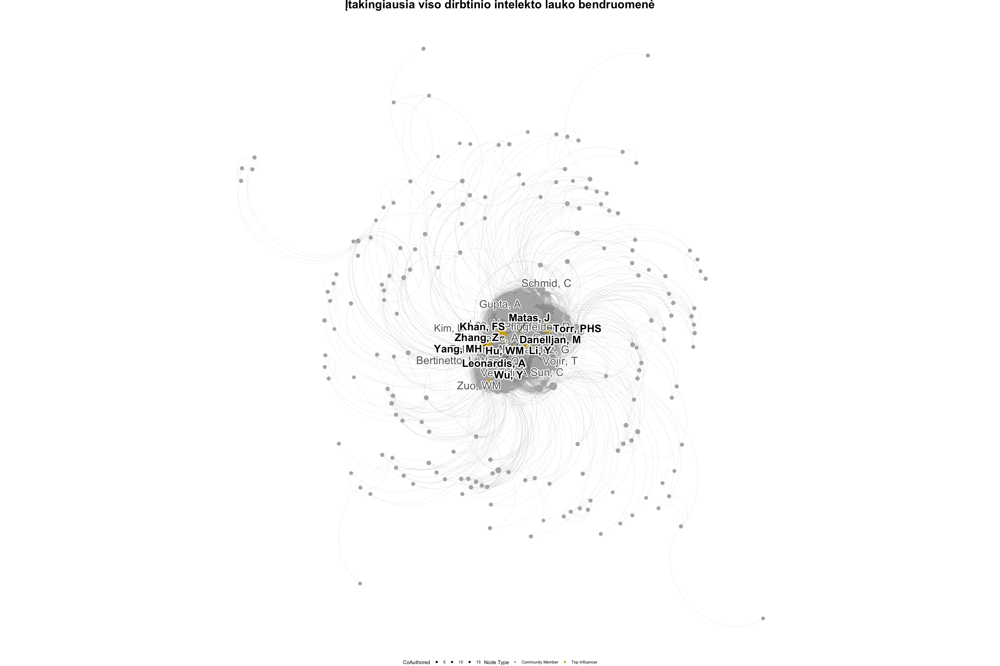

In [49]:
my_path <- "./dataset/generated/adjacency.csv"
final_plot <- visualize_most_influential_community(my_path, top_k = 10, label_limit=25, title='Įtakingiausia viso dirbtinio intelekto lauko bendruomenė')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)